# 🐶 Multi-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier usisng TensorFlow 2.0 and TensorFlow Hub.


## 1. Problem
Identifiying the breed of a dog given an image of a dog.

## 2. Data
Data source: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

## 4. Feature
* We are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 dog breeds (this means there are 120 different classes)
* There are around 10,000++ images in the training set.
* There are around 10,000++ images in the test set.

In [1]:
#!unzip "/content/drive/MyDrive/Dataset/Dog Breed/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dataset/Dog Breed"

## Get workspace ready
* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [2]:
# Import tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version", tf.__version__)
print("TF Hub Version", hub.__version__)

# Check for GPU availability 
print("GPU", "available (YESSSS!!!)" if tf.config.list_physical_devices("GPU") else "Not available")

TF Version 2.8.0
TF Hub Version 0.12.0
GPU available (YESSSS!!!)


## Getting out data ready (Turn data into Tensors)
Turn images into Tensors(numerical representations)

In [3]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dataset/Dog Breed/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


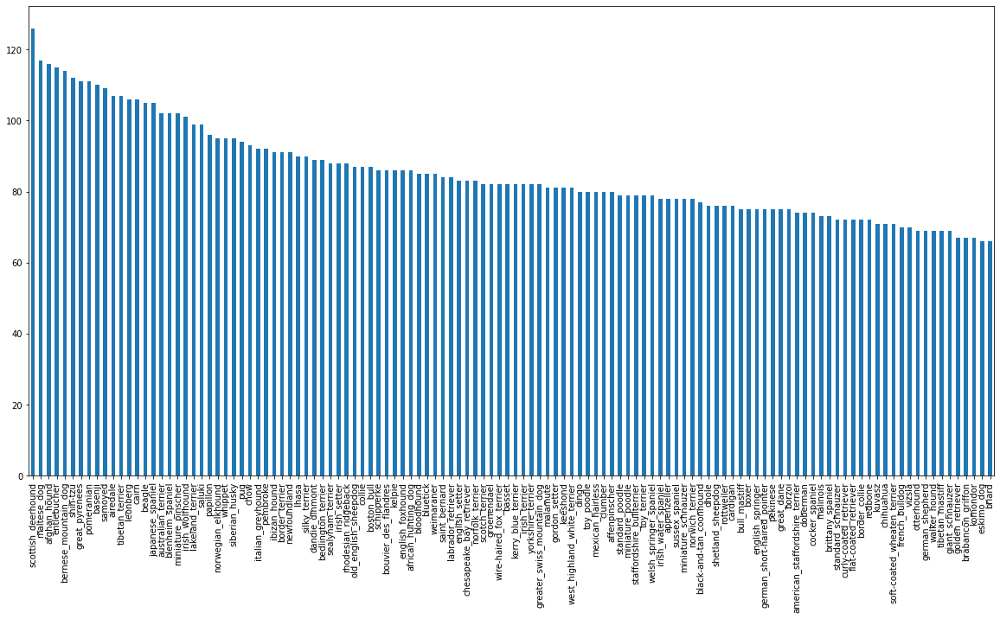

In [4]:
labels_csv.breed.value_counts().plot.bar(figsize=(20,10));

In [5]:
labels_csv.breed.value_counts().median()

82.0

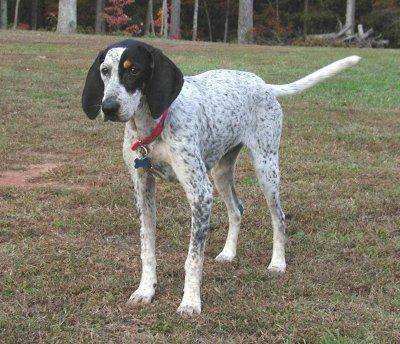

In [6]:
# View an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dataset/Dog Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images & their labels
Get a list of all the image file pathnames

In [7]:
# Create pathnames from image iDs
filenames = ["/content/drive/MyDrive/Dataset/Dog Breed/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['/content/drive/MyDrive/Dataset/Dog Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dataset/Dog Breed/train/")) == len(filenames):
  print("Aits bruh")
else:
  print('Hell no bruh')

Aits bruh


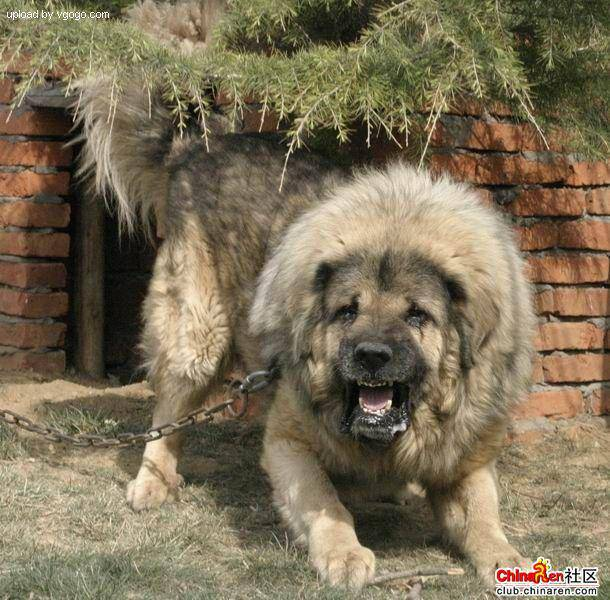

In [9]:
# Double check
Image(filenames[9000])

In [10]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [11]:
# Prepare list of labels
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
# Check if length of labels matches the length of filenames
#len(labels), len(filenames)

if len(labels) == len(filenames):
  print('Oh yeah!')
else:
  print('bruhhhh')

Oh yeah!


In [13]:
# Find unique values of labels
unique_breed = np.unique(labels)
len(unique_breed)

120

In [14]:
# Turn every label into boolean array (OneHotEncoding)
boolean_labels = [label == unique_breed for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Create validation set

In [15]:
# Setup X & y variables
x = filenames
y = boolean_labels

### Start by using 1000 images and increase as needed

In [16]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000, max:10000}

In [17]:
# Split data into train and validatation
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing Images (Turn images into Tensors)
Write function which:
1. Take image filepath as input
2. Use TensorFlow to read file and save into varaible image
3. Turn image into tensors
4. Normalize our image (convert color channel from 0-255 to 0-1
5. Resize image to be shape of (224,224)
6. Return modified image


In [18]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [19]:
# Define image size
IMG_SIZE = 224

# Create function for preprocessing images
def process_img(image_path, img_size = IMG_SIZE):
  """
  Take an image path and turn it into tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn jpg image into numerical tensor with 3 color channel
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert color channel from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches

In [20]:
# Create function to return tuple (image, label)
def get_image_label (image_path, label):
  """
  Takes an image file path name and the associated label,
  process the image and returns a tuple of (image, label).
  """
  image = process_img(image_path)
  return image, label

In [21]:
(process_img(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [22]:
# Make a function and turn all data (x&y) into batches
# Define batch size, 32
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Create batches of data out of image x and label y pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths no labels
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating valid data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    # Shuffling pathnames & labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Create image label tuple (Turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [23]:
# Create training & validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches
Creating valid data batches


In [24]:
# Check out different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [25]:
## Visualising data batches
import matplotlib.pyplot as plt

# Create function for viewing images in a data batch
def show_25_images(image, labels):
  """
  Display a plot of 25 images and their labels from a data batch
  """
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(image[i])
    # Add the image label as the title
    plt.title(unique_breed[labels[i].argmax()])
    # Turn grid lines off
    plt.axis("off")

In [26]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images , train_labels

(array([[[[0.3364557 , 0.3129263 , 0.21766537],
          [0.33891886, 0.31538945, 0.21969774],
          [0.32088134, 0.29735193, 0.20152767],
          ...,
          [0.35496292, 0.28437468, 0.19025706],
          [0.33226463, 0.2616764 , 0.17540188],
          [0.3260504 , 0.25546217, 0.16918762]],
 
         [[0.3380252 , 0.31621072, 0.209979  ],
          [0.33443865, 0.31327033, 0.2045717 ],
          [0.30350533, 0.28253582, 0.17307815],
          ...,
          [0.37393996, 0.3033517 , 0.20923406],
          [0.31768206, 0.24709381, 0.16081929],
          [0.30892855, 0.23834029, 0.15206577]],
 
         [[0.303646  , 0.28260258, 0.1688771 ],
          [0.31029022, 0.2892468 , 0.17552131],
          [0.28490898, 0.26386556, 0.15014006],
          ...,
          [0.36053413, 0.2899459 , 0.19582829],
          [0.30744046, 0.23685223, 0.15057771],
          [0.29868695, 0.2280987 , 0.14182419]],
 
         ...,
 
         [[0.5178527 , 0.33353898, 0.16883309],
          [0.52240

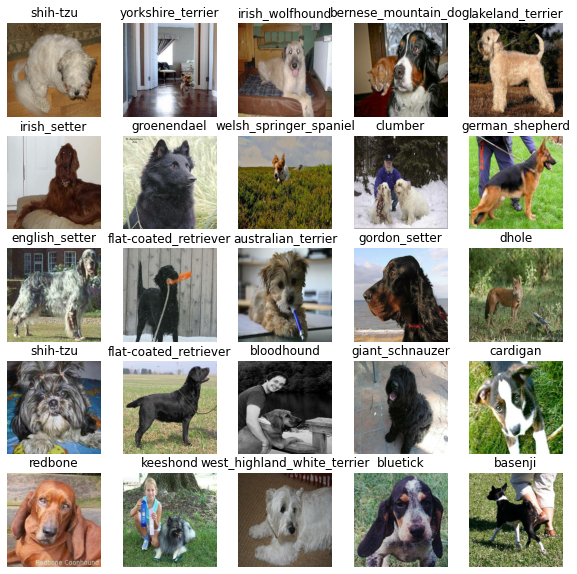

In [27]:
show_25_images(train_images, train_labels)

In [28]:
# Visualise validation set
val_images, val_labels = next(val_data.as_numpy_iterator())

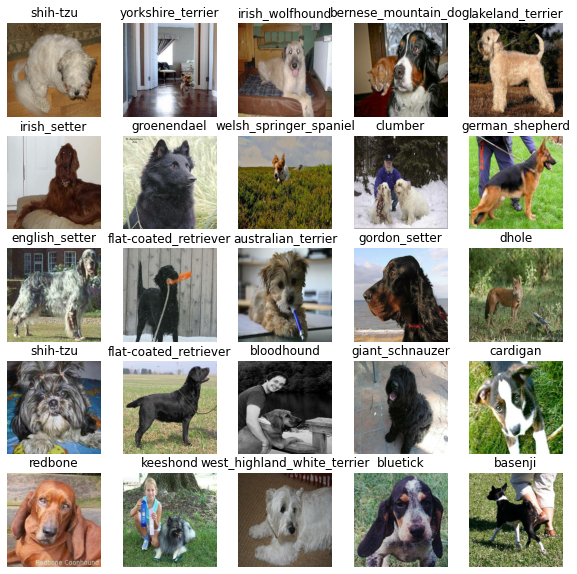

In [29]:
show_25_images(train_images, train_labels)

## Build model
Few things to define:
* Input shape (our images shape, in the form of Tensors) to our model.
* Output shape (image labels, in the form of Tensors) of our model.
* URL of the model we using is from TensorFlow Hub -https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [30]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breed)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

After having input & output ready to go.
We will put them into a Keras deep learning model.

Create function:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first then this then that)
* Compile the model
* Build the model (tells the model the input shape it'll be getting)
* Returns the model

In [31]:
# Create function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Layer 1(Input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation='softmax') # Layer 2 (Output layer)
  ])

  # Compile model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build model
  model.build(INPUT_SHAPE)

  return model

In [32]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks: Helper function is a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

Create 2 callbacks:
* TensorBoard which helps track our model's progress
* Early stopping which prevents the model to overfit

### TensorBoard callback

To setup tensorboard callback we need 3 things:
1. Load TensorBoard notebook extension
2. Create a TensorBoard callback which is ablt to save logs to a directory and pass it to our model's `fit()` function.
3. Visualise our models training logs with the `%tensorboard` magic function (we'll fo this after model training.)

In [33]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [34]:
import datetime

# Create function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dataset/Dog Breed/logs",
                        # Make it so logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [35]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)
Our first model is only train on 1000 images, to make sure everything is working

In [36]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10,max:100, step:10}


Create function which trains a model.
* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we are gonna use.
* Return the model

In [37]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [38]:
# Fit model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 102s 2s/step - loss: 4.5920 - accuracy: 0.0950 - val_loss: 3.3884 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 3s 135ms/step - loss: 1.6126 - accuracy: 0.6913 - val_loss: 2.2021 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 3s 132ms/step - loss: 0.5600 - accuracy: 0.9362 - val_loss: 1.6891 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 157ms/step - loss: 0.2491 - accuracy: 0.9812 - val_loss: 1.4845 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1452 - accuracy: 0.9975 - val_loss: 1.4122 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 3s 132ms/step - loss: 0.1002 - accuracy: 1.0000 - val_loss: 1.3566 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================

### Model is overfitting, train data is is scoring higher than validation data
Check TensorBoard logs

In [39]:
%tensorboard --logdir drive/MyDrive/Dataset/Dog\ Breed/logs

<IPython.core.display.Javascript object>

### Make & evaluate predictions using a trained model

In [40]:
# Make prediction on validation data
preds = model.predict(val_data, verbose=1)
preds

7/7 [==============================] - 4s 106ms/step


array([[1.1135510e-03, 9.3678909e-06, 1.5440823e-03, ..., 2.2402273e-04,
        8.5982147e-06, 3.2127896e-04],
       [7.0182345e-04, 9.7885367e-04, 4.8458412e-02, ..., 2.6599714e-04,
        3.3153514e-03, 4.0166554e-04],
       [3.4146410e-06, 4.2675080e-04, 3.9018985e-05, ..., 1.2691789e-04,
        9.9788003e-06, 1.1170981e-03],
       ...,
       [5.1926168e-06, 5.6265246e-05, 1.8026052e-05, ..., 2.5684562e-06,
        1.7471832e-05, 3.0597857e-05],
       [1.8698080e-03, 4.2769338e-05, 9.0848960e-05, ..., 2.9471260e-04,
        3.6900605e-05, 2.2061853e-02],
       [4.1511861e-04, 7.8788516e-06, 3.5209264e-04, ..., 1.7228333e-03,
        1.7322312e-03, 4.2743675e-05]], dtype=float32)

In [41]:
 # First prediction
 index = 0
 print(preds[index])
 print(f"Max value (probability of prediction): {np.max(preds[index])}")
 print(f"Sum: {np.sum(preds[index])}")
 print(f"Max index: {np.argmax(preds[index])}")
 print(f"Predicted label:  {unique_breed[np.argmax(preds[index])]}")

[1.1135510e-03 9.3678909e-06 1.5440823e-03 2.4811803e-05 3.9816520e-04
 9.2133596e-05 3.8457906e-03 1.4216610e-04 1.2933616e-04 3.2094409e-04
 2.6571166e-04 8.2485458e-05 1.0253486e-04 3.5135407e-05 5.2156451e-05
 8.2418032e-04 3.3200435e-05 2.0502064e-01 1.0679478e-05 1.3390084e-05
 5.2845321e-04 1.6126850e-04 5.7643829e-06 5.6932721e-04 4.9065660e-05
 8.3781459e-05 2.4300133e-01 1.8963805e-05 2.7598198e-05 1.8807975e-04
 1.2285802e-04 8.6119695e-04 6.4511099e-05 8.5067796e-07 7.6906683e-05
 1.9722067e-02 9.4236439e-06 2.4342111e-05 1.2271611e-05 4.8807578e-05
 4.5903615e-04 4.2404678e-05 1.5790109e-04 6.4957749e-05 1.2499208e-06
 1.0305478e-04 1.6573002e-05 1.0553382e-04 8.0795828e-05 5.5306708e-05
 4.4047782e-05 1.4311510e-04 3.7251972e-05 3.1194113e-06 4.6447829e-05
 7.1136651e-06 3.8178099e-05 4.8399298e-04 3.4709947e-04 1.7473394e-01
 9.2097005e-05 3.0988010e-06 7.2288461e-04 5.6431400e-06 1.1905549e-04
 5.5799663e-02 8.6951753e-05 1.1282422e-04 1.1335328e-03 5.4543038e-06
 3.696

In [42]:
# Turn prediction probability into their respective labels
def get_pred_label(preds_proba):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breed[np.argmax(preds_proba)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(preds[81])
pred_label

'dingo'

In [43]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [44]:
# Create function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch of dataset of (image, label) Tensors & returns seperate arrays
  of images and labels
  """
  images = []
  labels = []

  # Loop through unbatch data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])

  return images, labels

# Unbactchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [45]:
get_pred_label(val_labels[0])

'affenpinscher'

In [46]:
images_ = []
labels_ = []
# Loop through unbatch data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

labels_[0], images_[0]

(array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]), array([[[0.29599646, 0.43284872, 0.3056691 ],


Now we've got ways to get:
* Prediction labels
* Validation labels (Truth labels)
* Validation images

Create function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images, integers and an integer.
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, it's predicted probability, the truth label and the target image on single plot.

In [47]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change title color depending on if the prediction is right or wrong
  if pred_label == true_label:
    color="green"
  else:
    color='red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                    color=color)

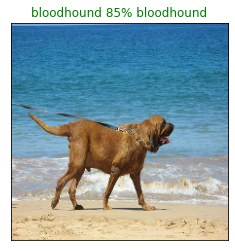

In [48]:
plot_pred(prediction_probabilities= preds, labels=val_labels, images=val_images, n=100)

Make a function to visualize our model top predictions (top 10 predictions)
This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction label
* Plot top 10 prediction probability values & labels, coloring the true label green

In [49]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexed
  top_10_index = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_values = pred_prob[top_10_index]

  # Find top 10 prediction labels
  top_10_labels = unique_breed[top_10_index]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_labels)),
                     top_10_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_labels)),
             labels=top_10_labels,
             rotation='vertical')
  
  # Change color of true label
  if np.isin(true_label, top_10_labels):
    top_plot[np.argmax(top_10_labels == true_label)].set_color("green")
  else:
    pass

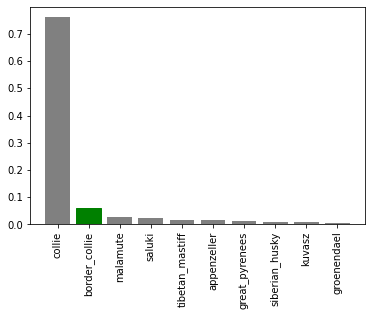

In [50]:
plot_pred_conf(prediction_probabilities= preds, labels=val_labels,n=9)

### Evaluating our model

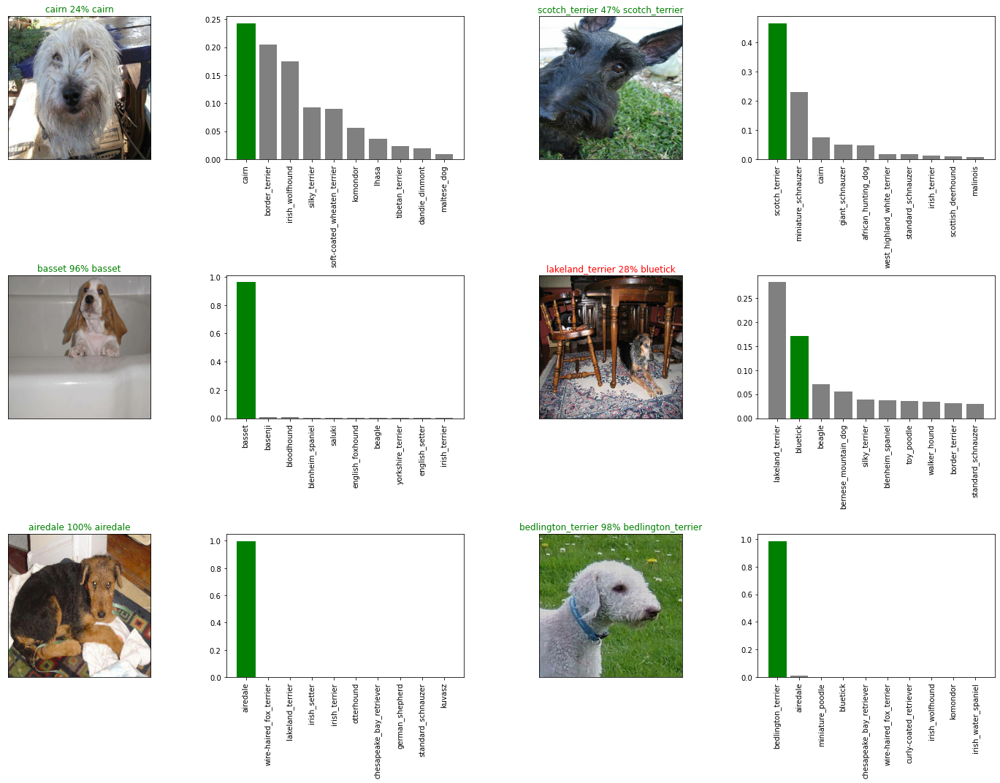

In [51]:
# Check out a few predictions & their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=preds,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=preds,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Save & reload model

In [52]:
# Create function to save a model
def save_model(model, suffix=None):
  """
  Save model in a models directory & appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dataset/Dog Breed/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [53]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [54]:
# Save model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dataset/Dog Breed/models/20220307-055142-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dataset/Dog Breed/models/20220307-055142-1000-images-mobilenetv2-Adam.h5'

In [55]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dataset/Dog Breed/models/20220305-023727-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dataset/Dog Breed/models/20220305-023727-1000-images-mobilenetv2-Adam.h5


In [56]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.1838 - accuracy: 0.6850


[1.1837725639343262, 0.6850000023841858]

In [57]:
# Evaluate loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.3126 - accuracy: 0.6750


[1.3126492500305176, 0.675000011920929]

## Training model on full data

In [58]:
# Create data batch with full dataset
full_data = create_data_batches(x, y)

Creating training data batches


In [59]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
# Create model for a full data
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [61]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can't monitor validation accuracy
full_model_eary_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                            patience=3)

**Note:** Running the cell below will take a long time.

In [62]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_eary_stopping])

Epoch 1/100
320/320 [==============================] - 41s 118ms/step - loss: 1.3252 - accuracy: 0.6707
Epoch 2/100
320/320 [==============================] - 37s 114ms/step - loss: 0.3977 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 40s 126ms/step - loss: 0.2380 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1531 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1066 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 44s 139ms/step - loss: 0.0774 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0581 - accuracy: 0.9908
Epoch 8/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0465 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 44s 139ms/step - loss: 0.0363 - accuracy: 0.9971
Epoch 10/100
320/320 [==============================] - 43s 135m

In [63]:
# Save full model
save_model(full_model, suffix="full-image-set-mobinenetV2-Adam")

Saving model to: /content/drive/MyDrive/Dataset/Dog Breed/models/20220307-061353-full-image-set-mobinenetV2-Adam.h5...


'/content/drive/MyDrive/Dataset/Dog Breed/models/20220307-061353-full-image-set-mobinenetV2-Adam.h5'

In [66]:
# Load full model
loaded_full_model = load_model("/content/drive/MyDrive/Dataset/Dog Breed/models/20220307-061353-full-image-set-mobinenetV2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dataset/Dog Breed/models/20220307-061353-full-image-set-mobinenetV2-Adam.h5


In [67]:
len(x)

10222

## Make prediction on test dataset
* Get the test image filename
* Convert filenames into test data batches using `create_data_batches()` and set `test_data` parameter to `True` since test data doesnt have labels.
* Make a prediction araay by passing the test batches to the `predict()` method called on the model.

In [69]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dataset/Dog Breed/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dataset/Dog Breed/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e2b24cea9d0796ffad73cb24eab1a3f6.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e00a1b26edd5cb7323e3b75ce37b36f6.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e1f9be3ecf0409189486c786ff4bd65a.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/deec42d608968cccb3ab91e306194fed.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e71d9f32ea6eb1c2d944e8f4e811c209.jpg',
 '/content/drive/MyDrive/Dataset/Dog Breed/test/e1cad2c1658b4a81db4750218a1f57d2.jpg']

In [70]:
len(test_filenames)

10357

In [71]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [72]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:*** Cell below will take a long time to run

In [73]:
# Make prediction on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 990s 3s/step


In [74]:
# Save predictions (Numpy array) to csv files (for acess later)
np.savetxt("/content/drive/MyDrive/Dataset/Dog Breed/preds_array.csv", test_predictions, delimiter=",")

In [75]:
# Load predictions (Numpy array) from CSV file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dataset/Dog Breed/preds_array.csv", delimiter=",")

In [78]:
test_predictions.shape

(10357, 120)

### Prepare test dataset predictions for submission
* Create a pandas DataFrame with ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image id from their file paths.
* Add data to each of dog breed column
* Export data frame as csv

In [82]:
# Create DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breed))

In [86]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [87]:
preds_df['id'] = test_ids

In [88]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e200fe397f6ca5d626210830fc38aca9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2b24cea9d0796ffad73cb24eab1a3f6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7f95aabf775a636b3893ffa120adaf9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e78d3997b4e7f4abc1299f81b8e3b2d9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
# Add prediction probabilities to each dog bredd column
preds_df[list(unique_breed)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e200fe397f6ca5d626210830fc38aca9,3.537333e-10,4.599632e-11,3.150510e-10,3.198344e-09,6.563279e-08,3.653345e-03,1.694877e-09,1.041330e-07,1.105204e-05,...,3.866897e-09,3.288489e-10,2.892396e-09,4.400297e-08,2.494717e-11,6.266319e-09,2.863855e-10,4.050939e-07,8.892392e-11,1.016950e-10
1,e2b24cea9d0796ffad73cb24eab1a3f6,3.016650e-14,1.456647e-10,1.893887e-11,4.573128e-13,3.159461e-06,2.743161e-11,8.874562e-11,3.183199e-10,3.372748e-12,...,5.910237e-10,1.556625e-10,3.411044e-14,1.157754e-08,2.258748e-09,1.661935e-14,1.479859e-10,9.998908e-01,4.726774e-08,1.321781e-11
2,e7f95aabf775a636b3893ffa120adaf9,8.027222e-01,2.357998e-09,5.674114e-09,4.249127e-11,8.862579e-08,2.185803e-11,2.153983e-07,4.106814e-09,1.199746e-09,...,4.871319e-05,2.954103e-07,3.462193e-08,6.135320e-09,2.340979e-08,1.963787e-10,3.118909e-10,1.421760e-10,2.109613e-08,4.546015e-05
3,e774fbfeb4b712ca042f93edea3835af,1.392749e-08,4.425839e-10,1.848313e-11,8.778249e-05,1.630653e-09,5.112717e-08,1.569330e-07,1.421823e-09,8.564336e-10,...,1.522300e-09,1.961960e-09,9.261312e-07,5.245009e-10,2.586985e-11,3.828910e-09,9.869756e-10,1.199473e-07,3.375096e-06,3.314732e-09
4,e78d3997b4e7f4abc1299f81b8e3b2d9,1.073573e-08,1.944447e-13,4.483911e-09,2.764211e-14,4.147966e-10,4.720418e-12,2.706462e-08,8.903743e-09,5.291842e-12,...,2.861363e-09,6.604867e-07,6.880715e-12,1.256327e-11,1.920946e-11,3.140255e-13,1.194629e-09,4.496122e-10,7.097423e-13,4.300054e-09


In [92]:
# Save predictions dataframe to csv
preds_df.to_csv("/content/drive/MyDrive/Dataset/Dog Breed/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

## Make prediction on custom images
* Get the file path
* Turn the filepaths into data batches using `create_data_batches()`. Since our custom images won't have labels, we set the `test_data` to `True`.
* Pass custom image data batch to out model's `predict()` method.
* Convert the predictions output probabilities to predictions labels.
* Compare the predicted labels to the custom image.

In [98]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dataset/Dog Breed/myPhotos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [99]:
custom_image_path

['/content/drive/MyDrive/Dataset/Dog Breed/myPhotos/02121343-275a-4031-afb8-578214182c68.JPG',
 '/content/drive/MyDrive/Dataset/Dog Breed/myPhotos/IMG_5613.JPG',
 '/content/drive/MyDrive/Dataset/Dog Breed/myPhotos/IMG_5731.JPG']

In [100]:
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [101]:
# Make prediction on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [102]:
custom_preds.shape

(3, 120)

In [103]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['maltese_dog', 'lakeland_terrier', 'golden_retriever']

In [104]:
# Get custom images (Previous unbatchify() function won't work since there aren't labels...maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

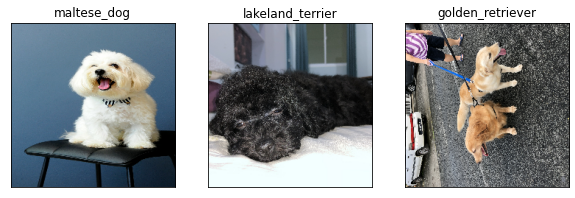

In [107]:
# Check custom image prediction
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)